In [1]:
import time
from time import process_time
# starting process
start_time = time.process_time()

In [2]:
import os

import numpy as np

import pandas as pd
from pandas_datareader import data as pdr
from pandas import (
    read_csv as rcsv,
    read_sql_query as rsqq, 
    Timestamp as tstamp,
)
# Import date and timedelta class
from datetime import date
from datetime import timedelta

import sqlalchemy as sql
from sqlalchemy import (
    create_engine as ce,
    inspect
)

import scipy as sci
from scipy import stats
import scipy.optimize as sco

import matplotlib.pyplot as plt

import yfinance as yf

import hvplot.pandas
import holoviews as hv
import seaborn as sns

from pathlib import Path

from MCForecastTools import MCSimulation
from calculations import MPTCalculations as mpt
from metrics import QuantMetrics as qm
from dataset import DataCollection as ds

import warnings
warnings.filterwarnings('ignore')

print(f"Package imports and dependencies resolved")

Package imports and dependencies resolved


### Portfolio Analysis and Optimization with Post-Modern Portfolio Theory (PMPT)

---
Steps Involved:
1. Project Settings
2. Data Preparation (Data Collection, Clean and Format)
3. Quantitative Analysis
4. Visualizations

### 1. Project Settings
- Define the time delta (time-frame) to start with in the historical time reference.

In [3]:
# Specify date range for data
# Set start and end dates of 5 years "5Y" back from your current date
# Define the time delta (time-frame) to start with
time_delta = 10

end_date = pd.to_datetime('today')
# 5 years
start_date = end_date - np.timedelta64(time_delta, 'Y')
start, end = start_date, end_date
# Verify date range
print(f"Start date: {start} and End date: {end}")

Start date: 2012-10-22 06:26:53.194881 and End date: 2022-10-22 16:38:53.194881


### Add or remove stocks of possible sectors
- tech_list or others to evaluate the asset performance
- refer to dataset.py for the entire sector list

In [4]:
# Specify portfolio sectors - basket of market index and assets - S&P 500 Index (^GSPC) and Tech Stocks List
basket_list = ds.market + ds.blend_list # ds.tech_list + ds.energy_list + ds.industrials_list + ds.financials_list

print("Basket of stocks")
print(basket_list)

Basket of stocks
['^GSPC', 'IBM', 'TSLA', 'TSM', 'NVDA', 'DVN', 'OXY', 'CNI', 'NOC', 'BHF', 'AIG']


### 2. Data Preparation

In [5]:
# Dataframe closing prices of basket, i.e. market index and assets
# Fetch data from Yahoo Finance API
stock_data, raw_data = ds.get_raw_data(basket_list, start, end)
stock_data.rename(columns = {'^GSPC':'SP500_index'}, inplace = True)
stock_data = stock_data.reset_index()
raw_data.rename(columns = {'^GSPC':'SP500_index'}, inplace = True)

#### Raw Data dataframe

In [6]:
# Output raw data is raw_frame_close
display(raw_data.shape)
# Review random 5 rows from dataframe
display(raw_data.sample(5))

(2517, 66)

Attributes    Adj Close                                                 \
Symbols     SP500_index         IBM        TSLA        TSM        NVDA   
Date                                                                     
2017-07-11  2425.530029  114.252106   21.814667  30.763239   38.525978   
2019-09-25  2984.870117  117.977325   15.246667  42.188652   44.382366   
2015-06-03  2114.070068  117.855331   16.599333  18.611082    5.257674   
2020-08-14  3372.850098  108.360237  110.047333  75.269173  115.392059   
2013-07-18  1689.369995  130.775757    7.935333  12.931830    3.398515   

Attributes                                                           ...  \
Symbols           DVN        OXY         CNI         NOC        BHF  ...   
Date                                                                 ...   
2017-07-11  24.946762  49.635742   77.965370  241.499878        NaN  ...   
2019-09-25  20.636213  42.686916   87.570312  356.955444  40.360001  ...   
2015-06-03  50.427280  59.818253   53.701752  142.587280        NaN  ...   
2020-08-14  10.584234  14.506077  101.546272  329.399841  32.180000  ...   
2013-07-18  43.657009  63.342266   44.916435   75.126266        NaN  ...   

Attributes     Volume                                                  \
Symbols           IBM         TSLA         TSM        NVDA        DVN   
Date                                                                    
2017-07-11  3606085.0  173391000.0   9300800.0  75795600.0  7450900.0   
2019-09-25  2642928.0  141406500.0   6719500.0  30843200.0  4347500.0   
2015-06-03  2229026.0   26722500.0  10846500.0  25078800.0  2378500.0   
2020-08-14  3099716.0  188664000.0   5611200.0  36643600.0  4218100.0   
2013-07-18  8779496.0  170971500.0  43566600.0  34448800.0  2257000.0   

Attributes                                                           
Symbols            OXY        CNI        NOC        BHF         AIG  
Date                                                                 
2017-07-11   2757300.0  1429800.0   523800.0        NaN   2883400.0  
2019-09-25   4324500.0   971100.0  1349500.0  1023200.0   3355300.0  
2015-06-03   4178103.0  1426400.0  1189100.0        NaN  12437800.0  
2020-08-14  21267200.0  1054800.0   396200.0   465000.0   4862800.0  
2013-07-18   2962754.0  1340400.0  1528600.0        NaN  11468600.0  

[5 rows x 66 columns]

#### Cleaned Stock Data dataframe - close prices

In [7]:
# Output cleaned data to 'Close' prices is stock_data, cut table down to 29 columns from 174 columns
display(stock_data.shape)
print("Review random 5 rows from dataframe")
# Review random 5 rows from dataframe
display(stock_data.sample(5))

(2517, 12)

Review random 5 rows from dataframe


Symbols,Date,SP500_index,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
2343,2022-02-14,4401.669922,130.149994,291.920013,119.769997,242.669998,52.259998,41.230000,122.820000,390.600006,55.750000,58.990002
1626,2019-04-11,2888.320068,137.456985,17.894667,42.099998,47.884998,31.180000,67.180000,90.320000,277.390015,39.529999,45.709999
680,2015-07-09,2051.310059,156.644363,17.194668,22.219999,4.852500,55.939999,72.995697,56.480000,162.690002,NaN,61.759998
469,2014-09-05,2007.709961,182.791580,18.492666,21.180000,4.992500,72.739998,97.061203,73.570000,127.529999,NaN,55.040001
7,2012-11-02,1414.199951,184.923523,1.928000,15.770000,3.122500,57.799999,75.044952,43.689999,68.980003,NaN,32.680000


#### Confirm and review raw data storage in csv file

In [8]:
# Import the [~offline stored] data from the csv file
# Generate dataframe setting the DatetimeIndex with 'date' as as index. 
working_raw_data = rcsv(
    Path('data/raw_frame_close.csv'),
    index_col=0,
    parse_dates=True,
    infer_datetime_format=True,
    header = [0,1]
)

# Output dataframe name is working_raw_frame_close
print('Sample row of DataFrame from local csv data source path:')
display(working_raw_data.shape)

# Display sample 5 rows of dataframe
display(working_raw_data.sample(5))

Sample row of DataFrame from local csv data source path:


(2517, 66)

Attributes    Adj Close                                               \
Symbols           ^GSPC         IBM       TSLA        TSM       NVDA   
Date                                                                   
2014-11-20  2052.750000  109.811592  16.580667  17.903135   4.886638   
2013-10-07  1676.119995  120.821747  12.204667  13.554955   3.659792   
2012-11-09  1379.849976  124.153526   2.021333  12.244134   2.797565   
2013-05-01  1582.699951  131.243942   3.552000  14.302284   3.172183   
2017-07-12  2443.250000  114.632477  21.968000  31.032791  40.164589   

Attributes                                                   ...     Volume  \
Symbols           DVN        OXY        CNI         NOC BHF  ...        IBM   
Date                                                         ...              
2014-11-20  52.234123  62.485207  64.658272  121.451645 NaN  ...  4375523.0   
2013-10-07  45.040634  66.600212  46.104820   81.509644 NaN  ...  4148854.0   
2012-11-09  40.919838  52.041142  37.698174   54.577126 NaN  ...  3840494.0   
2013-05-01  42.303837  60.344109  42.530525   64.008492 NaN  ...  5124459.0   
2017-07-12  25.175554  49.821014  79.154808  242.713654 NaN  ...  3240403.0   

Attributes                                                              \
Symbols            TSLA         TSM         NVDA        DVN        OXY   
Date                                                                     
2014-11-20   53808000.0  11797500.0   22096800.0  3741900.0  3911858.0   
2013-10-07  172284000.0   6451300.0   16995200.0  1732300.0  2906285.0   
2012-11-09   12945000.0  12006600.0   84628000.0  4523100.0  5666964.0   
2013-05-01   41142000.0   8604300.0   34131600.0  8214600.0  7570078.0   
2017-07-12  155191500.0   9211200.0  114520800.0  5668700.0  3355800.0   

Attributes                                        
Symbols           CNI        NOC BHF         AIG  
Date                                              
2014-11-20   762400.0   763400.0 NaN   7717900.0  
2013-10-07   989200.0  1828200.0 NaN   5298400.0  
2012-11-09   909400.0  2043300.0 NaN  21658500.0  
2013-05-01  1838800.0  1853300.0 NaN  17502400.0  
2017-07-12  2311000.0   533600.0 NaN   2686600.0  

[5 rows x 66 columns]

#### Clean, confirm, and review sample from csv raw data

In [9]:
# Verify Close columns of each stocks and index
working_raw_data['Close']

Symbols,^GSPC,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
Date,,,,,,,,,,,
2012-10-22,1433.819946,185.850861,1.856667,15.330000,2.992500,61.369999,79.337067,43.935001,70.199997,NaN,35.549999
2012-10-23,1413.109985,182.839386,1.892667,15.220000,3.082500,59.590000,77.871231,43.494999,69.660004,NaN,34.750000
2012-10-24,1408.750000,182.332703,1.828000,15.150000,3.042500,58.770000,77.296394,43.474998,69.330002,NaN,34.930000
2012-10-25,1412.969971,183.173996,1.834667,15.380000,3.045000,58.880001,79.059227,43.514999,69.040001,NaN,34.980000
2012-10-26,1411.939941,184.770554,1.825333,15.500000,3.012500,58.290001,77.066460,43.355000,68.019997,NaN,34.720001
...,...,...,...,...,...,...,...,...,...,...,...
2022-10-17,3677.949951,121.519997,219.350006,64.889999,118.879997,69.800003,67.360001,111.150002,475.089996,49.840000,51.730000
2022-10-18,3719.979980,122.940002,220.190002,63.709999,119.669998,69.769997,67.779999,113.500000,506.799988,51.419998,52.599998
2022-10-19,3695.159912,122.510002,222.039993,63.660000,120.510002,71.940002,68.459999,112.910004,510.910004,50.570000,52.750000


### Create 'basket' from SQLite temp db

In [10]:
# Fetch date indexed and unindexed data frames created out of SQLite temp db
sql_basket_indexed_df, sql_basket_df = ds.sqlite_data(stock_data)

print("Unindexed dataframe counts and column summary")
display(sql_basket_df.shape) 
# Display sample 5 rows of unindexed dataframe
display(sql_basket_df.sample(5))

print("Indexed dataframe counts and column summary")
display(sql_basket_indexed_df.shape) 

# Display sample 5 rows of indexed datafarme
display(sql_basket_indexed_df.sample(5))

Unindexed dataframe counts and column summary


(2517, 12)

,Date,SP500_index,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
550,2014-12-31,2058.899902,153.384323,14.827333,22.379999,5.012500,61.209999,80.472961,68.910004,147.389999,NaN,56.009998
4,2012-10-26,1411.939941,184.770554,1.825333,15.500000,3.012500,58.290001,77.066460,43.355000,68.019997,NaN,34.720001
1770,2019-11-05,3074.620117,131.826004,21.148001,53.549999,52.402500,22.980000,41.910000,93.699997,337.850006,41.049999,54.810001
210,2013-08-26,1656.780029,176.615677,10.948000,16.260000,3.747500,58.070000,84.232758,47.840000,94.550003,NaN,47.360001
1350,2018-03-07,2726.800049,151.357559,22.153334,44.200001,60.459999,30.950001,65.190002,72.989998,346.820007,52.380001,57.310001


Indexed dataframe counts and column summary


(2517, 11)

,SP500_index,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
Date,,,,,,,,,,,
2013-07-23,1692.390015,186.405350,8.182667,16.740000,3.5525,57.400002,88.170395,49.455002,88.760002,NaN,46.599998
2014-11-21,2063.500000,153.843216,16.185333,23.059999,5.1125,67.199997,83.926178,72.099998,139.130005,NaN,54.590000
2016-04-13,2082.419922,144.579346,16.968666,26.170000,9.1850,30.959999,72.239998,63.520000,201.130005,NaN,55.139999
2016-07-12,2152.139893,150.133850,14.976667,26.969999,13.2000,40.009998,77.370003,61.189999,220.470001,NaN,53.860001
2016-01-26,1903.630005,117.198853,12.904000,21.590000,7.1750,24.559999,63.122509,50.570000,182.500000,NaN,55.910000


### 3. Quant Analysis

In [11]:
# Display constants being used in quant analysis
print("Number of trading days per year = ", qm.num_trading_days)
print("Risk free rate = ", qm.risk_free_rate)
print("Number of random portfolio runs = ", qm.num_random_portfolio_run)
print("Number of days in rolling window = ", qm.rolling_window_days)
print("Number of days of input dataframe to use as historical data = ", mpt.historical_days_percent)
print("Number of days of input dataframe to use as test/experiment data  = ", mpt.test_days_percent)

Number of trading days per year =  252
Risk free rate =  0.03
Number of random portfolio runs =  10000
Number of days in rolling window =  20
Number of days of input dataframe to use as historical data =  0.975
Number of days of input dataframe to use as test/experiment data  =  0.025000000000000022


In [12]:
display(sql_basket_indexed_df.shape)

(2517, 11)

In [13]:
# Break up the input asset price data frame into 2 chunks
# (1) For use of historical data to determine what the optimum portfolio selection should be
# (2) For test purposes,test how wll the portfolio allocation performs
num_days_total = sql_basket_indexed_df.shape[0]
num_historical_days_percent = round(num_days_total * mpt.historical_days_percent)
num_test_days_percent = round(num_days_total * mpt.test_days_percent)

print("Total # of days in asset dataframe = ", num_days_total)
print("Total # of days will use for hisotrical data = ", num_historical_days_percent)
print("Total # of days will use for testing results = ", num_test_days_percent)


# Extract the days from full dataframe will use for historical data
asset_mkt_prices_historical_df = sql_basket_indexed_df.iloc[0:num_historical_days_percent-1, :].copy()
asset_mkt_prices_test_df = sql_basket_indexed_df.iloc[num_historical_days_percent:num_days_total-1,:].copy()

Total # of days in asset dataframe =  2517
Total # of days will use for hisotrical data =  2454
Total # of days will use for testing results =  63


In [14]:
# Plot the individual asset prices taking previous 5.6 years (80% of 7 years period)
asset_mkt_prices_historical_df.drop('SP500_index', axis=1, inplace=False).hvplot.line(
    ylabel="Prices", 
    xlabel="Date",
    width = 1200,
    height = 500,
    hover_color = 'magenta',
    title="(In-Sample) Performance of Historical Assets Prices"
)

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [15]:
# Plot the individual asset prices in the next 1.4 year (20% of 7 years period)
asset_mkt_prices_test_df.drop('SP500_index', axis=1, inplace=False).hvplot.line(
    ylabel="Prices", 
    xlabel="Date",
    width = 1200,
    height = 500,
    hover_color = 'magenta',
    title="(Out-of-Sample) Assets Prices"
)

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

#### Calculate Descriptive Stats
---
* Asset Returns, Standard Deviation, Cumulative Returns, Covariance, Correlation Matrix, Sharpe Ratio

In [16]:
# Compute the frequency components on asset prices
asset_mkt_prices_returns_df,        \
asset_mkt_prices_ann_returns_mean,  \
asset_mkt_prices_std_df,            \
asset_mkt_prices_ann_std_df,        \
asset_mkt_prices_std_rolling_df,    \
asset_mkt_prices_ann_cov_mtrx_df,   \
asset_mkt_prices_ann_corr_mtrx_df,  \
asset_mkt_prices_cum_returns_df,    \
asset_prices_sharpe_ratio_df,       \
log_returns                           = qm.mpt_qa_compute_freq_stats(asset_mkt_prices_historical_df)

In [17]:
# Review daily returns DataFrame
print("Asset Returns:")
display(asset_mkt_prices_returns_df.shape)
# Display randow 5 rows of the returns
display(asset_mkt_prices_returns_df.sample(5))

Asset Returns:


(1263, 11)

,SP500_index,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
Date,,,,,,,,,,,
2021-03-03,-0.013066,0.016870,-0.048424,-0.024683,-0.044867,0.009342,0.030194,-0.004288,0.001071,0.013174,0.022846
2018-03-12,-0.001274,0.005963,0.056057,0.014129,0.018057,0.003056,0.003455,0.004160,-0.014072,-0.001485,0.000707
2022-04-25,0.005698,0.006148,-0.006995,0.005853,0.019831,-0.032547,-0.030025,0.007699,-0.007555,0.002242,-0.012574
2021-07-01,0.005222,0.001705,-0.002619,-0.014481,0.010474,0.026379,0.050847,0.000948,0.011529,0.009003,0.014076
2021-11-08,0.000888,0.007524,-0.048401,0.026401,0.035359,0.012391,0.026032,-0.007675,-0.003019,-0.008895,0.003392


In [18]:
# Plot the distribution of the returns of the individual assets
asset_mkt_prices_returns_df.hvplot.hist(
    bins=100, 
    subplots=True, 
    width=400, 
    group_label='Ticker', 
    grid=True
).cols(3)

:NdLayout   [Default]
   :Histogram   [AIG]   (AIG_count)

In [19]:
# Plot the asset cumulative returns
asset_mkt_prices_cum_returns_df.hvplot.line(
    ylabel="Cum Returns", 
    xlabel="Date",
    width = 1200,
    height = 500,
    hover_color = 'magenta',
    title="Market & Assets Cumulative Returns"
)

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

<AxesSubplot:title={'center':'Asset & Market: Daily Returns Box Plot'}>

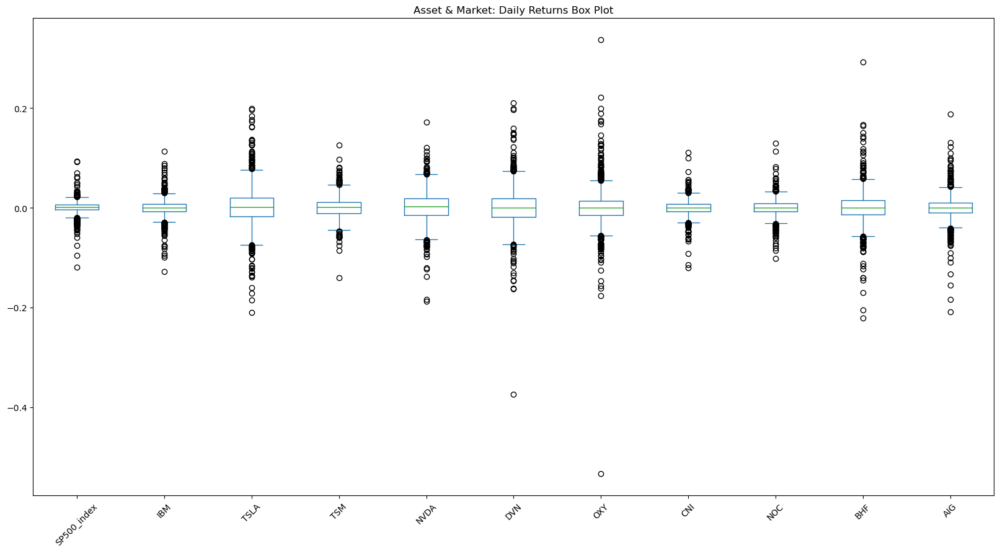

In [20]:
# Use the daily return data to create box plots to visualize the volatility of the assets 
asset_mkt_prices_returns_df.plot.box(
    figsize=(20, 10), 
    rot=45, 
    title = "Asset & Market: Daily Returns Box Plot"
)

In [21]:
# Sort the asset deviations
asset_mkt_prices_ann_std_sorted_df = asset_mkt_prices_ann_std_df.sort_values()

print("Asset annualized standard deviations (Sorted):")
display(asset_mkt_prices_ann_std_sorted_df)

Asset annualized standard deviations (Sorted):


SP500_index    0.207389
CNI            0.246134
IBM            0.273641
NOC            0.277375
TSM            0.334062
AIG            0.394690
NVDA           0.496845
BHF            0.525080
DVN            0.591464
OXY            0.619202
TSLA           0.636238
dtype: float64

In [22]:
# Dispaly the (sorted) asset sharpe ratios
print("Assets & Market: Annual Sharpe Ratio (Sorted):")
display(asset_prices_sharpe_ratio_df.sort_values())

asset_prices_sharpe_ratio_df.hvplot(
    kind = 'bar',
    width = 1000,
    height = 500,
    hover_color = 'magenta',
    rot = 45,
    title = "Assets & Market: Annual Sharpe Ratio")

Assets & Market: Annual Sharpe Ratio (Sorted):


IBM            0.041688
BHF            0.065452
AIG            0.087802
OXY            0.336608
CNI            0.388560
DVN            0.492438
NOC            0.523010
SP500_index    0.563151
TSM            0.690870
NVDA           0.828383
TSLA           1.116484
dtype: float64

:Bars   [index]   (0)

In [23]:
# Drop the market from asset/mkt data frame
asset_prices_df = asset_mkt_prices_historical_df.drop(['SP500_index'], axis=1, inplace=False)
print("Asset Prices DataFrame (does not include market)")
display(asset_prices_df)

market_df = pd.DataFrame(asset_mkt_prices_returns_df['SP500_index'])

# Recompute frequence components (e.g. covariance matrix will be different).
asset_mkt_prices_returns_df,        \
asset_mkt_prices_ann_returns_mean,  \
asset_mkt_prices_std_df,            \
asset_mkt_prices_ann_std_df,        \
asset_mkt_prices_std_rolling_df,    \
asset_mkt_prices_ann_cov_mtrx_df,   \
asset_mkt_prices_ann_corr_mtrx_df,  \
asset_mkt_prices_cum_returns_df,    \
asset_prices_sharpe_ratio_df,       \
log_returns                           = qm.mpt_qa_compute_freq_stats(asset_prices_df)

Asset Prices DataFrame (does not include market)


,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
Date,,,,,,,,,,
2012-10-22,185.850861,1.856667,15.330000,2.992500,61.369999,79.337067,43.935001,70.199997,NaN,35.549999
2012-10-23,182.839386,1.892667,15.220000,3.082500,59.590000,77.871231,43.494999,69.660004,NaN,34.750000
2012-10-24,182.332703,1.828000,15.150000,3.042500,58.770000,77.296394,43.474998,69.330002,NaN,34.930000
2012-10-25,183.173996,1.834667,15.380000,3.045000,58.880001,79.059227,43.514999,69.040001,NaN,34.980000
2012-10-26,184.770554,1.825333,15.500000,3.012500,58.290001,77.066460,43.355000,68.019997,NaN,34.720001
...,...,...,...,...,...,...,...,...,...,...
2022-07-18,138.130005,240.546661,83.580002,161.009995,54.619999,60.049999,112.430000,449.260010,40.189999,49.889999
2022-07-19,130.880005,245.529999,86.150002,169.919998,57.209999,62.820000,115.430000,457.390015,41.650002,51.740002
2022-07-20,129.179993,247.500000,86.559998,178.070007,57.680000,63.549999,114.750000,456.070007,41.970001,51.520000


In [24]:
print("Annual Covariance Matrix:")
display(asset_mkt_prices_ann_cov_mtrx_df.head())

print("Correlation Matrix:")
display(asset_mkt_prices_ann_corr_mtrx_df)

Annual Covariance Matrix:


,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
IBM,0.074879,0.038131,0.035675,0.047987,0.065968,0.068717,0.033188,0.032885,0.081009,0.056451
TSLA,0.038131,0.404799,0.083525,0.146870,0.093988,0.081129,0.044870,0.010689,0.091223,0.065474
TSM,0.035675,0.083525,0.111598,0.105448,0.067318,0.061243,0.036399,0.017558,0.073541,0.045829
NVDA,0.047987,0.146870,0.105448,0.246855,0.090380,0.070962,0.053845,0.031036,0.100914,0.063127
DVN,0.065968,0.093988,0.067318,0.090380,0.349829,0.283999,0.066418,0.041570,0.170792,0.127855


Correlation Matrix:


,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
IBM,1.000000,0.219017,0.390258,0.352953,0.407588,0.405553,0.492758,0.433263,0.563801,0.522679
TSLA,0.219017,1.000000,0.392981,0.464615,0.249761,0.205932,0.286526,0.060568,0.273061,0.260729
TSM,0.390258,0.392981,1.000000,0.635314,0.340705,0.296071,0.442684,0.189486,0.419251,0.347582
NVDA,0.352953,0.464615,0.635314,1.000000,0.307555,0.230661,0.440301,0.225207,0.386816,0.321911
DVN,0.407588,0.249761,0.340705,0.307555,1.000000,0.775454,0.456231,0.253390,0.549939,0.547690
OXY,0.405553,0.205932,0.296071,0.230661,0.775454,1.000000,0.420654,0.296766,0.531399,0.530103
CNI,0.492758,0.286526,0.442684,0.440301,0.456231,0.420654,1.000000,0.362593,0.559680,0.521854
NOC,0.433263,0.060568,0.189486,0.225207,0.253390,0.296766,0.362593,1.000000,0.345868,0.347123
BHF,0.563801,0.273061,0.419251,0.386816,0.549939,0.531399,0.559680,0.345868,1.000000,0.785646
AIG,0.522679,0.260729,0.347582,0.321911,0.547690,0.530103,0.521854,0.347123,0.785646,1.000000


[Text(0.5, 1.0, 'Asset Prices Correlation Matrix')]

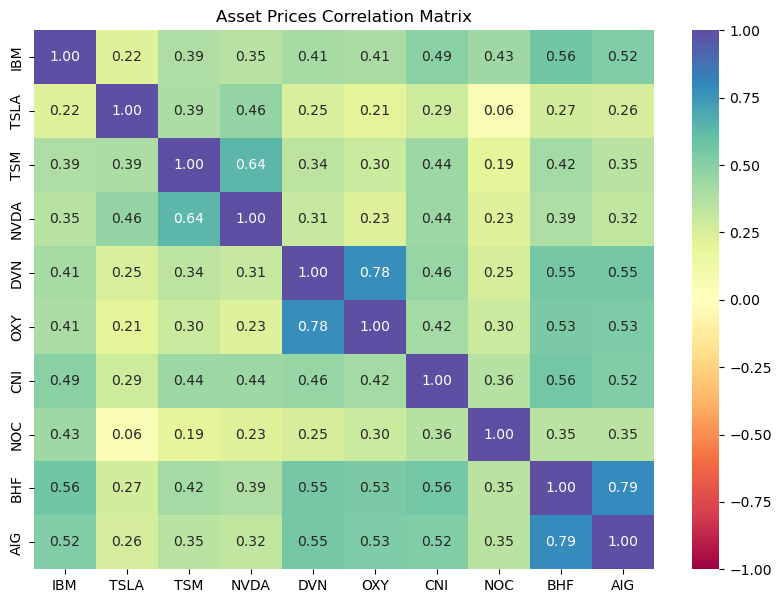

In [25]:
# Use the `heatmap` function from the seaborn library to visualize the correlation matrix
plt.figure(figsize = (10,7))
sns.heatmap(
    asset_mkt_prices_ann_corr_mtrx_df, 
    annot=True, 
    vmin=-1, 
    vmax=1, 
    fmt=".2f", 
    cmap="Spectral"
).set(
    title='Asset Prices Correlation Matrix')

In [26]:
print("Annual average asset returns:")
display(asset_mkt_prices_ann_returns_mean)

Annual average asset returns:


IBM     0.011407
TSLA    0.710350
TSM     0.230793
NVDA    0.411578
DVN     0.291259
OXY     0.208428
CNI     0.095638
NOC     0.145070
BHF     0.034367
AIG     0.034654
dtype: float64

___
### Efficient Frontier Computation

In [27]:
# Determine the efficient frontier components
efficient_frontier_df = qm.mpt_qa_get_efficient_frontier(asset_prices_df, asset_mkt_prices_ann_returns_mean, asset_mkt_prices_ann_cov_mtrx_df)

print("Efficient Frontier DataFrame:")
display(efficient_frontier_df.shape)

print("Print random 5 rows of Efficient Frontier sample points")
display(efficient_frontier_df.sample(5))

Efficient Frontier DataFrame:


(10000, 13)

Print random 5 rows of Efficient Frontier sample points


,Returns,Volatility,SharpeRatio,IBM_W,TSLA_W,TSM_W,NVDA_W,DVN_W,OXY_W,CNI_W,NOC_W,BHF_W,AIG_W
4532,0.262106,4.984533,0.046565,0.104800,0.158075,0.028330,0.124925,0.122348,0.126418,0.125875,0.085242,0.062727,0.061260
2619,0.230589,4.840888,0.041436,0.032124,0.022222,0.262178,0.238265,0.012782,0.142410,0.073966,0.071715,0.073442,0.070896
5013,0.226158,5.113101,0.038364,0.003120,0.124434,0.166540,0.026632,0.115154,0.134935,0.172479,0.011813,0.093529,0.151363
7181,0.283616,5.557361,0.045636,0.006731,0.231938,0.017518,0.081829,0.069812,0.170740,0.054600,0.065444,0.073156,0.228231
6051,0.121842,4.995906,0.018383,0.115194,0.003840,0.029220,0.030354,0.132531,0.057286,0.050511,0.209387,0.221684,0.149993


In [28]:
# Select the following portfolio allocations:
# (1) Based on the "minimum" risk
# (2) Based on the "maximum" risk
# (3) Based on the "optimum sharpe ratio"
portfolio_min_volatility, portfolio_max_volatility, portfolio_opt_sharpe_ratio = qm.mpt_qa_return_portfolio_allocations(efficient_frontier_df)

print("Efficient Frontier: Min Volatility Point:")
display(portfolio_min_volatility)
print("\nEfficient Frontier: Max Volatility Point:")
display(portfolio_max_volatility)
print("\nEfficient Frontier: Opt Sharpe Ratio Volatility Point:")
display(portfolio_opt_sharpe_ratio)

Efficient Frontier: Min Volatility Point:


Returns        0.165926
Volatility     3.672779
SharpeRatio    0.037009
IBM_W          0.179394
TSLA_W         0.025878
TSM_W          0.256539
NVDA_W         0.047739
DVN_W          0.040391
OXY_W          0.047905
CNI_W          0.227425
NOC_W          0.154770
BHF_W          0.009255
AIG_W          0.010705
Name: 1838, dtype: float64


Efficient Frontier: Max Volatility Point:


Returns        0.165694
Volatility     6.502133
SharpeRatio    0.020869
IBM_W          0.068026
TSLA_W         0.026292
TSM_W          0.043749
NVDA_W         0.029354
DVN_W          0.193021
OXY_W          0.245344
CNI_W          0.000649
NOC_W          0.027891
BHF_W          0.257395
AIG_W          0.108278
Name: 4793, dtype: float64


Efficient Frontier: Opt Sharpe Ratio Volatility Point:


Returns        0.384842
Volatility     5.743467
SharpeRatio    0.061782
IBM_W          0.028225
TSLA_W         0.272768
TSM_W          0.163066
NVDA_W         0.224970
DVN_W          0.082860
OXY_W          0.138051
CNI_W          0.023683
NOC_W          0.027762
BHF_W          0.021147
AIG_W          0.017469
Name: 7931, dtype: float64

In [29]:
# Plot the efficient frontier #3 (Efficient frontier + porfolio selection points + 3rd color dimension of the sharpe ratio points)
scatter = hv.Scatter(
    (
        efficient_frontier_df['Volatility'], 
        efficient_frontier_df['Returns'], 
        efficient_frontier_df.loc[:,'SharpeRatio']),
    'Volatility',
    ['Return', 'Sharpe Ratio'],
)
max_sharpe = hv.Scatter([(portfolio_opt_sharpe_ratio[1],portfolio_opt_sharpe_ratio[0])])
min_volatility = hv.Scatter([(portfolio_min_volatility[1],portfolio_min_volatility[0])])
max_volatility = hv.Scatter([(portfolio_max_volatility[1],portfolio_max_volatility[0])])

scatter.opts(title="Efficient Frontier + Min/Max/Opt Sharpe Ratio Selections", color='Sharpe Ratio', width=1000, height=600, colorbar=True, padding=0.1) *\
max_sharpe.opts(color='blue', line_color='black', size=15,) *\
min_volatility.opts(color='yellow', line_color='black', size=15) *\
max_volatility.opts(color='red', line_color='black', size=15)


:Overlay
   .Scatter.I   :Scatter   [Volatility]   (Return,Sharpe Ratio)
   .Scatter.II  :Scatter   [x]   (y)
   .Scatter.III :Scatter   [x]   (y)
   .Scatter.IV  :Scatter   [x]   (y)

### Visualization for: "mpt_performance_eval.py"

In [30]:
# Select the following portfolio allocations:
# (1) Based on the "minimum volatility" risk
# (2) Based on the "maximum returns" risk
# (3) Based on the "optimum sharpe ratio"
portfolio_min_volatility_returns_df = mpt.mpt_pe_compute_portfolio_returns(asset_mkt_prices_returns_df, portfolio_min_volatility)
portfolio_max_volatility_returns_df = mpt.mpt_pe_compute_portfolio_returns(asset_mkt_prices_returns_df, portfolio_max_volatility)
portfolio_opt_sharpe_ratio_volatility_returns_df = mpt.mpt_pe_compute_portfolio_returns(asset_mkt_prices_returns_df, portfolio_opt_sharpe_ratio)

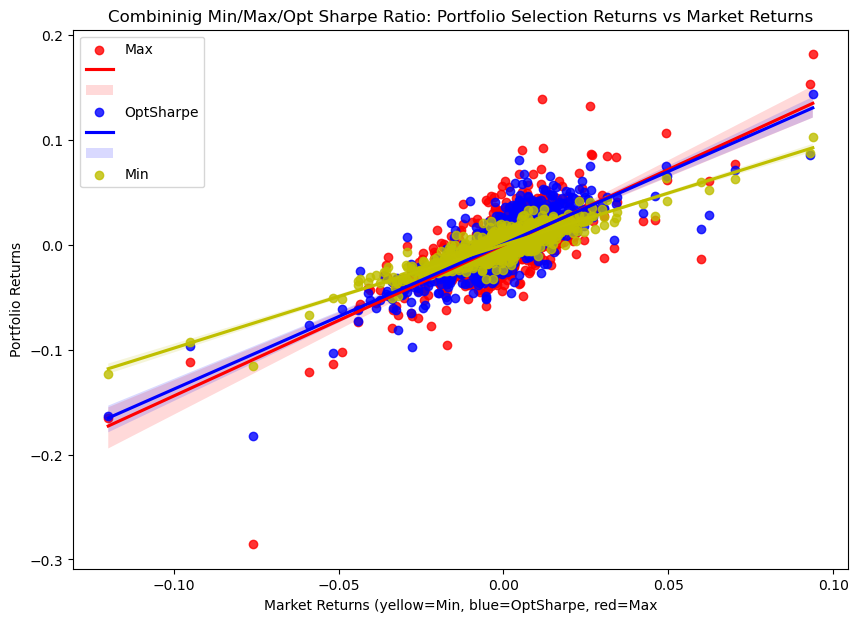

In [31]:
plt.subplots(figsize=(10,7))

x_df = market_df.reset_index(drop=True)
y_df = portfolio_max_volatility_returns_df
z_df = pd.concat([x_df, y_df], axis=1, join="inner")
z_df.columns = ["Market", "MaxVol"]
sns.regplot(x="Market", y="MaxVol", data=z_df, color='r')

y_df = portfolio_opt_sharpe_ratio_volatility_returns_df
z_df = pd.concat([x_df, y_df], axis=1, join="inner")
z_df.columns = ["Market", "OptSharpe"]
sns.regplot(x="Market", y="OptSharpe", data=z_df, color='b')

y_df = portfolio_min_volatility_returns_df
z_df = pd.concat([x_df, y_df], axis=1, join="inner")
z_df.columns = ["Market", "MinReturns"]
sns.regplot(x="Market", y="MinReturns", data=z_df, color='y')

plt.xlabel("Market Returns (yellow=Min, blue=OptSharpe, red=Max")
plt.ylabel("Portfolio Returns")
plt.legend(["Max", "", "", "OptSharpe", "", "", "Min"])
plt.title("Combininig Min/Max/Opt Sharpe Ratio: Portfolio Selection Returns vs Market Returns")

plt.show()

In [32]:
portfolio_min_weights = mpt.mpt_pe_get_portfolio_weights_df(portfolio_min_volatility)

# Plot horizontal bar chart of the porfolio allocation/weights
portfolio_min_weights.hvplot.barh(
    y='weights', 
    title='Portfolio Composition - Minimum / Lowest risk tolerant Protfolio', 
    height=400,
    width = 1000,
    rot=45,
    hover_color = 'magenta'
)

:Bars   [index]   (weights)

In [33]:
portfolio_opt_sharpe_ratio_weights = mpt.mpt_pe_get_portfolio_weights_df(portfolio_opt_sharpe_ratio)

# Plot horizontal bar chart of the porfolio allocation/weights
portfolio_opt_sharpe_ratio_weights.hvplot.barh(
    y='weights', 
    title='Portfolio Composition - Balanced; Optimal Sharpe Ratio Protfolio', 
    height=400,
    width = 1000,
    rot=45,
    hover_color = 'magenta'
)

:Bars   [index]   (weights)

In [34]:
portfolio_max_weights = mpt.mpt_pe_get_portfolio_weights_df(portfolio_max_volatility)

# Plot horizontal bar chart of the porfolio allocation/weights
portfolio_max_weights.hvplot.barh(
    y='weights', 
    title='Portfolio Composition - Max return, High risk tolerant Protfolio', 
    height=400,
    width = 1000,
    rot=45,
    hover_color = 'magenta'
)

:Bars   [index]   (weights)

### Compute Actual Realized Portfolio Value under the Test dataframe components

In [35]:
asset_prices_test_beg_df = pd.DataFrame(sql_basket_indexed_df.iloc[num_historical_days_percent, :]).drop('SP500_index', axis=0, inplace=False)
asset_prices_test_end_df = pd.DataFrame(sql_basket_indexed_df.iloc[num_days_total-1, :]).drop('SP500_index', axis=0, inplace=False)

print("Beginning and end dates used for the testing the performance of the portfolio")
display(asset_prices_test_beg_df.T)
display(asset_prices_test_end_df.T)

Beginning and end dates used for the testing the performance of the portfolio


,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
2022-07-26,128.080002,258.859985,84.419998,165.330002,56.759998,62.07,116.790001,444.649994,41.459999,51.73


,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
2022-10-21,129.899994,214.440002,63.75,124.660004,74.290001,71.260002,112.82,522.659973,52.150002,53.25


___
### Monte-Carlo Dataframe Weights List

In [36]:
# Arrange Monte Carlo dataframe weights list
portfolio_mc_min_weights = mpt.mpt_pe_get_mc_weights(portfolio_min_weights)
portfolio_mc_opt_sharpe_ratio_weights = mpt.mpt_pe_get_mc_weights(portfolio_opt_sharpe_ratio_weights)
portfolio_mc_max_weights = mpt.mpt_pe_get_mc_weights(portfolio_max_weights)

In [37]:
investment_pnl_min = mpt.mpt_pe_compute_investment_pnl(mpt.initial_test_investment, asset_prices_test_beg_df, asset_prices_test_end_df, pd.DataFrame(portfolio_mc_min_weights))[0][0]
investment_pnl_opt_sharpe_ratio = mpt.mpt_pe_compute_investment_pnl(mpt.initial_test_investment, asset_prices_test_beg_df, asset_prices_test_end_df, pd.DataFrame(portfolio_mc_opt_sharpe_ratio_weights))[0][0]
investment_pnl_max = mpt.mpt_pe_compute_investment_pnl(mpt.initial_test_investment, asset_prices_test_beg_df, asset_prices_test_end_df, pd.DataFrame(portfolio_mc_max_weights))[0][0]

print("Actual realized portfolio value for low-risk tolerance/Balanced or opt_Sharpe allocations/high-risk tolerance:")
display(investment_pnl_min)
display(investment_pnl_opt_sharpe_ratio)
display(investment_pnl_max)

Actual realized portfolio value for low-risk tolerance/Balanced or opt_Sharpe allocations/high-risk tolerance:


9331.989868164062

9426.000106811523

11682.480163574219

### Run Monte-Carlo Simulations
---
* Compute expected Returns, and 
* Compare against realized returns

In [38]:
print("Number of MC runs:", mpt.num_mc_runs)

Number of MC runs: 1200


In [39]:
# Slice the "test" dataframe to use for MC sims to predict returns
asset_mc_test_df = asset_mkt_prices_test_df.drop('SP500_index', axis=1, inplace=False)

In [40]:
# Arrange Monte-Carlo dataframe to have tuples for column names
asset_prices_mc_col_df = mpt.mpt_pe_get_mc_porfolio_df(asset_mc_test_df)

In [41]:
# Configure the Monte-Carlo simulation to forecast 1 year (20% of 5 years period)
# cumulative returns on the minimum risk portfolio weights
# Run 500 samples.
MC_min_portfolio = MCSimulation(
    portfolio_data = asset_prices_mc_col_df,
    weights = portfolio_mc_min_weights,
    num_simulation = mpt.num_mc_runs,
    num_trading_days = num_test_days_percent
)

# Review the simulation input data
print("Monte Carlo Portfolio (Min)")
MC_min_portfolio.portfolio_data.tail()

Monte Carlo Portfolio (Min)


IBM                     TSLA                     TSM  \
                 close daily_return       close daily_return      close   
Date                                                                      
2022-10-14  120.040001    -0.014369  204.990005    -0.075456  63.919998   
2022-10-17  121.519997     0.012329  219.350006     0.070052  64.889999   
2022-10-18  122.940002     0.011685  220.190002     0.003829  63.709999   
2022-10-19  122.510002    -0.003498  222.039993     0.008402  63.660000   
2022-10-20  128.300003     0.047261  207.279999    -0.066474  63.580002   

                               NVDA                     DVN               \
           daily_return       close daily_return      close daily_return   
Date                                                                       
2022-10-14    -0.040528  112.269997    -0.061288  68.019997    -0.058547   
2022-10-17     0.015175  118.879997     0.058876  69.800003     0.026169   
2022-10-18    -0.018185  119.669998     0.006645  69.769997    -0.000430   
2022-10-19    -0.000785  120.510002     0.007019  71.940002     0.031102   
2022-10-20    -0.001257  121.940002     0.011866  71.680000    -0.003614   

                  OXY                      CNI                      NOC  \
                close daily_return       close daily_return       close   
Date                                                                      
2022-10-14  66.680000    -0.019412  107.029999    -0.025405  464.190002   
2022-10-17  67.360001     0.010198  111.150002     0.038494  475.089996   
2022-10-18  67.779999     0.006235  113.500000     0.021143  506.799988   
2022-10-19  68.459999     0.010032  112.910004    -0.005198  510.910004   
2022-10-20  68.849998     0.005697  109.680000    -0.028607  512.440002   

                               BHF                     AIG               
           daily_return      close daily_return      close daily_return  
Date                                                                     
2022-10-14    -0.074286  48.630001    -0.006131  50.709999    -0.004515  
2022-10-17     0.023482  49.840000     0.024882  51.730000     0.020114  
2022-10-18     0.066745  51.419998     0.031701  52.599998     0.016818  
2022-10-19     0.008110  50.570000    -0.016531  52.750000     0.002852  
2022-10-20     0.002995  49.779999    -0.015622  51.849998    -0.017062

In [42]:
# Run the Monte Carlo simulation to forecast 1 year cumulative returns (min)
MC_min_portfolio.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,1190,1191,1192,1193,1194,1195,1196,1197,1198,1199
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.000530,0.997996,1.003881,1.011087,1.007288,1.008408,0.996012,0.991829,0.989603,1.003888,...,0.988376,0.990202,1.002862,1.004226,1.013740,1.021542,1.001887,1.002092,1.010457,1.004788
2,0.998062,0.986489,1.003977,1.012875,1.016266,1.011666,0.985579,0.986972,0.983249,1.014281,...,1.002320,0.980072,1.002464,1.000432,1.013743,1.022466,0.999939,1.001044,1.003276,1.009103
3,0.986967,0.984634,1.000332,1.011611,1.014912,1.015104,0.988933,0.981633,0.993111,1.002725,...,0.998325,0.984530,0.996963,0.984500,1.000208,1.024891,0.990938,0.977257,0.994959,1.001235
4,0.978806,0.971868,1.000161,0.999488,1.001711,0.995638,0.990230,0.971965,0.989030,1.000734,...,1.001117,0.990452,0.992322,1.001562,1.008418,1.040064,0.991935,0.973863,0.988210,1.010025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.923485,0.875054,1.017304,0.923574,0.950701,0.933519,0.834880,0.857680,0.986209,1.032449,...,0.876928,0.919458,0.915846,0.940535,0.902783,1.008789,0.867076,0.931030,0.962118,0.916477
60,0.915585,0.868077,1.015969,0.934001,0.970256,0.948575,0.832698,0.846891,1.000578,1.034728,...,0.873214,0.924507,0.914108,0.942250,0.899529,1.003833,0.872647,0.936838,0.959437,0.902359
61,0.919480,0.856475,1.012301,0.945721,0.966026,0.931107,0.827551,0.846024,1.009640,1.042703,...,0.870514,0.911049,0.922418,0.928195,0.895590,1.004269,0.861537,0.937640,0.945992,0.913838
62,0.916760,0.848436,1.014874,0.937704,0.980073,0.920661,0.838946,0.842477,0.985948,1.055920,...,0.873120,0.895877,0.919937,0.921497,0.885452,0.994772,0.867206,0.928475,0.935981,0.912427


In [43]:
# Configure the Monte-Carlo simulation to forecast 1 year (20% of 5 years period)
# cumulative returns on the maximum return risk-tolerant portfolio weights
# Run 500 samples.
MC_max_portfolio = MCSimulation(
    portfolio_data = asset_prices_mc_col_df,
    weights = portfolio_mc_max_weights,
    num_simulation = mpt.num_mc_runs,
    num_trading_days = num_test_days_percent
)

# Review the simulation input data
print("Monte Carlo Portfolio (Max)")
MC_max_portfolio.portfolio_data.tail()

Monte Carlo Portfolio (Max)


IBM                     TSLA                     TSM  \
                 close daily_return       close daily_return      close   
Date                                                                      
2022-10-14  120.040001    -0.014369  204.990005    -0.075456  63.919998   
2022-10-17  121.519997     0.012329  219.350006     0.070052  64.889999   
2022-10-18  122.940002     0.011685  220.190002     0.003829  63.709999   
2022-10-19  122.510002    -0.003498  222.039993     0.008402  63.660000   
2022-10-20  128.300003     0.047261  207.279999    -0.066474  63.580002   

                               NVDA                     DVN               \
           daily_return       close daily_return      close daily_return   
Date                                                                       
2022-10-14    -0.040528  112.269997    -0.061288  68.019997    -0.058547   
2022-10-17     0.015175  118.879997     0.058876  69.800003     0.026169   
2022-10-18    -0.018185  119.669998     0.006645  69.769997    -0.000430   
2022-10-19    -0.000785  120.510002     0.007019  71.940002     0.031102   
2022-10-20    -0.001257  121.940002     0.011866  71.680000    -0.003614   

                  OXY                      CNI                      NOC  \
                close daily_return       close daily_return       close   
Date                                                                      
2022-10-14  66.680000    -0.019412  107.029999    -0.025405  464.190002   
2022-10-17  67.360001     0.010198  111.150002     0.038494  475.089996   
2022-10-18  67.779999     0.006235  113.500000     0.021143  506.799988   
2022-10-19  68.459999     0.010032  112.910004    -0.005198  510.910004   
2022-10-20  68.849998     0.005697  109.680000    -0.028607  512.440002   

                               BHF                     AIG               
           daily_return      close daily_return      close daily_return  
Date                                                                     
2022-10-14    -0.074286  48.630001    -0.006131  50.709999    -0.004515  
2022-10-17     0.023482  49.840000     0.024882  51.730000     0.020114  
2022-10-18     0.066745  51.419998     0.031701  52.599998     0.016818  
2022-10-19     0.008110  50.570000    -0.016531  52.750000     0.002852  
2022-10-20     0.002995  49.779999    -0.015622  51.849998    -0.017062

In [44]:
# Run the Monte Carlo simulation to forecast 1 year cumulative returns (max)
MC_max_portfolio.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,1190,1191,1192,1193,1194,1195,1196,1197,1198,1199
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.007740,1.030761,0.985218,1.008642,1.023741,0.992719,0.992277,1.008081,1.026654,1.004085,...,1.011316,1.014723,1.007460,0.997318,0.997684,0.999413,0.985774,1.026353,0.999478,0.991451
2,1.001461,1.026415,0.969399,1.021710,1.029086,1.003418,0.988943,1.019485,1.034928,1.009087,...,1.028572,1.029498,1.000062,0.976023,1.001803,1.010343,0.972349,1.038016,1.014869,0.970893
3,1.006091,1.027300,0.995039,1.019446,1.043798,0.992971,1.017145,1.019740,1.069735,1.011107,...,1.039931,1.034866,1.006873,0.982287,0.997474,1.033680,0.978625,1.039410,1.029925,0.980152
4,1.005110,1.014042,0.997245,1.030131,1.051204,1.017983,1.015151,1.018429,1.077156,1.010595,...,1.024413,1.025694,1.001632,0.963114,1.011748,1.042665,0.991669,1.015711,1.016770,0.957407
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,1.050804,1.022981,0.999370,1.091752,1.260419,1.014564,1.136254,0.984935,1.055006,1.079479,...,0.950991,1.107586,1.039363,1.144154,1.033860,1.401352,0.923485,1.029143,1.311786,0.903154
60,1.056912,1.018191,0.985333,1.098745,1.251767,1.017860,1.136403,0.978127,1.069296,1.081300,...,0.978267,1.097438,1.065745,1.160260,1.027205,1.376821,0.924174,1.011320,1.335981,0.898196
61,1.069769,1.023859,0.982504,1.081168,1.239849,1.017499,1.134903,0.968594,1.091621,1.086959,...,0.974564,1.110407,1.096225,1.187356,1.032451,1.383868,0.911869,1.007988,1.320916,0.903785
62,1.072170,1.041656,0.994042,1.084219,1.251188,0.995237,1.130625,0.974165,1.094822,1.077752,...,0.973354,1.112648,1.087241,1.198674,1.030146,1.400367,0.911077,0.990162,1.286063,0.901856


In [45]:
# Configure the Monte-Carlo simulation to forecast 1 year (20% of 5 years period)
# cumulative returns on the optimal risk-return Sharpe Ratio of the portfolio
# Run 500 samples.

MC_opt_sharpe_ratio_portfolio = MCSimulation(
    portfolio_data = asset_prices_mc_col_df,
    weights = portfolio_mc_opt_sharpe_ratio_weights,
    num_simulation = mpt.num_mc_runs,
    num_trading_days = num_test_days_percent
)

# Review the simulation input data
print("Monte Carlo Portfolio (Opt Sharpe)")
MC_opt_sharpe_ratio_portfolio.portfolio_data.tail()

Monte Carlo Portfolio (Opt Sharpe)


IBM                     TSLA                     TSM  \
                 close daily_return       close daily_return      close   
Date                                                                      
2022-10-14  120.040001    -0.014369  204.990005    -0.075456  63.919998   
2022-10-17  121.519997     0.012329  219.350006     0.070052  64.889999   
2022-10-18  122.940002     0.011685  220.190002     0.003829  63.709999   
2022-10-19  122.510002    -0.003498  222.039993     0.008402  63.660000   
2022-10-20  128.300003     0.047261  207.279999    -0.066474  63.580002   

                               NVDA                     DVN               \
           daily_return       close daily_return      close daily_return   
Date                                                                       
2022-10-14    -0.040528  112.269997    -0.061288  68.019997    -0.058547   
2022-10-17     0.015175  118.879997     0.058876  69.800003     0.026169   
2022-10-18    -0.018185  119.669998     0.006645  69.769997    -0.000430   
2022-10-19    -0.000785  120.510002     0.007019  71.940002     0.031102   
2022-10-20    -0.001257  121.940002     0.011866  71.680000    -0.003614   

                  OXY                      CNI                      NOC  \
                close daily_return       close daily_return       close   
Date                                                                      
2022-10-14  66.680000    -0.019412  107.029999    -0.025405  464.190002   
2022-10-17  67.360001     0.010198  111.150002     0.038494  475.089996   
2022-10-18  67.779999     0.006235  113.500000     0.021143  506.799988   
2022-10-19  68.459999     0.010032  112.910004    -0.005198  510.910004   
2022-10-20  68.849998     0.005697  109.680000    -0.028607  512.440002   

                               BHF                     AIG               
           daily_return      close daily_return      close daily_return  
Date                                                                     
2022-10-14    -0.074286  48.630001    -0.006131  50.709999    -0.004515  
2022-10-17     0.023482  49.840000     0.024882  51.730000     0.020114  
2022-10-18     0.066745  51.419998     0.031701  52.599998     0.016818  
2022-10-19     0.008110  50.570000    -0.016531  52.750000     0.002852  
2022-10-20     0.002995  49.779999    -0.015622  51.849998    -0.017062

In [46]:
# Run the Monte Carlo simulation to forecast 1 year cumulative returns of the optimal (balanced) Sharpe Ratio
MC_opt_sharpe_ratio_portfolio.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,1190,1191,1192,1193,1194,1195,1196,1197,1198,1199
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.007816,0.999997,1.016880,1.003817,1.001697,0.999305,0.994220,1.015653,0.987223,0.995743,...,0.988391,0.991981,1.011982,1.003205,0.995537,0.989065,0.991946,0.996796,1.011268,0.989504
2,0.996354,1.013999,1.016547,0.993442,1.014825,1.000365,0.977630,1.003228,0.990942,0.971129,...,1.004563,0.987657,1.008229,0.986190,0.983976,0.992574,0.975714,0.990528,1.020971,0.986752
3,0.987192,1.034276,1.019012,0.994804,1.018556,0.994421,0.980783,0.982215,0.991079,0.977669,...,1.014749,0.999246,1.009468,0.966788,0.970929,0.989758,0.962032,0.989946,1.012020,0.980118
4,0.991410,1.013226,1.012021,1.016546,1.054438,0.993501,0.997443,0.979628,0.976827,0.973604,...,1.032124,1.001462,1.013038,0.963174,0.988030,1.010625,0.942734,0.975640,1.001053,0.966101
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.877298,1.062614,1.054488,1.024310,1.105078,1.015090,0.930077,0.857044,0.925314,0.993269,...,0.868106,1.017848,0.840647,0.784168,0.851014,0.959714,0.691532,0.887054,1.137931,0.901123
60,0.897023,1.076572,1.051240,1.064711,1.117381,1.025379,0.932452,0.864712,0.936808,1.003710,...,0.850916,1.001589,0.857554,0.792568,0.852745,0.943810,0.666087,0.877908,1.140668,0.880395
61,0.875591,1.068814,1.055305,1.071100,1.109829,1.006835,0.927040,0.851887,0.930117,0.982025,...,0.851681,0.977583,0.856180,0.786496,0.881290,0.946971,0.661869,0.856383,1.134249,0.874809
62,0.885368,1.064386,1.060346,1.069980,1.119921,1.020264,0.924476,0.835701,0.959696,0.966931,...,0.870465,0.973729,0.860355,0.799334,0.875714,0.929585,0.648421,0.875769,1.148959,0.884064


### 4. Visualizations

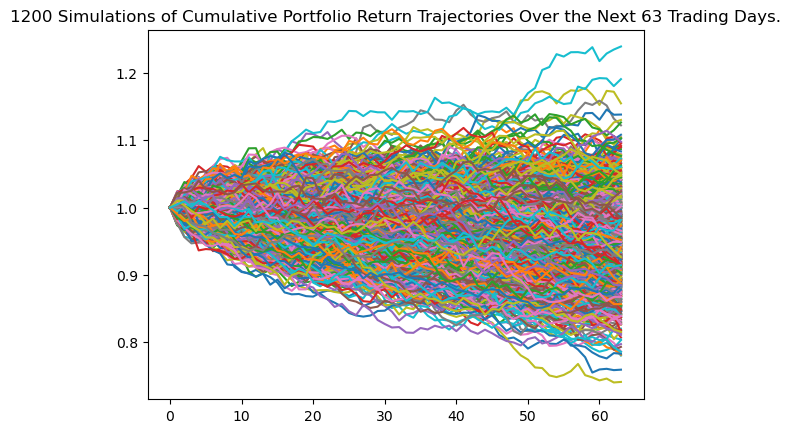

In [47]:
# Visualize the 1 year Monte Carlo simulation by creating an overlay line plot

line_plot_min_portfolio_plot = MC_min_portfolio.plot_simulation()

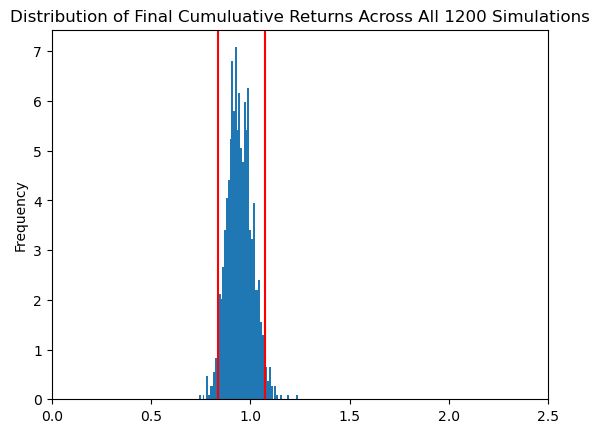

In [48]:
# Visualize the probability distribution of the 1 year Monte Carlo simulation 
# by plotting a histogram
plt.xlim([0, 2.5])
distribution_plot_min_portfolio_plot = MC_min_portfolio.plot_distribution()

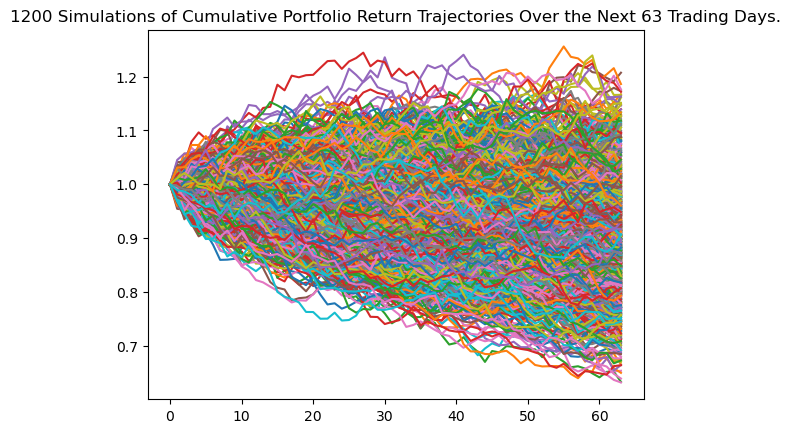

In [49]:
# Visualize the 1 year Monte Carlo simulation by creating an
# overlay line plot
line_plot_opt_sharpe_ratio_portfolio_plot = MC_opt_sharpe_ratio_portfolio.plot_simulation()

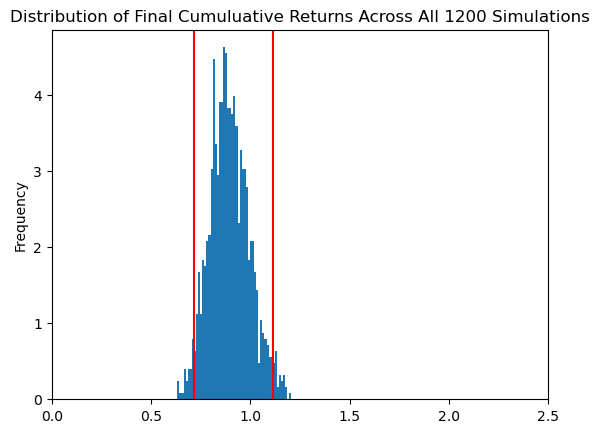

In [50]:
# Visualize the probability distribution of the 1 year Monte Carlo simulation 
# by plotting a histogram
plt.xlim([0, 2.5])
distribution_plot_opt_sharpe_ratio_portfolio_plot = MC_opt_sharpe_ratio_portfolio.plot_distribution()

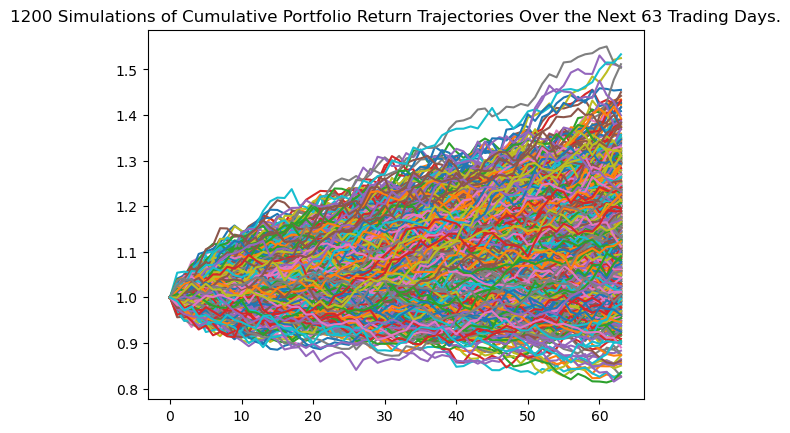

In [51]:
# Visualize the 1 year Monte Carlo simulation by creating an
# overlay line plot
line_plot_max_portfolio_plot = MC_max_portfolio.plot_simulation()

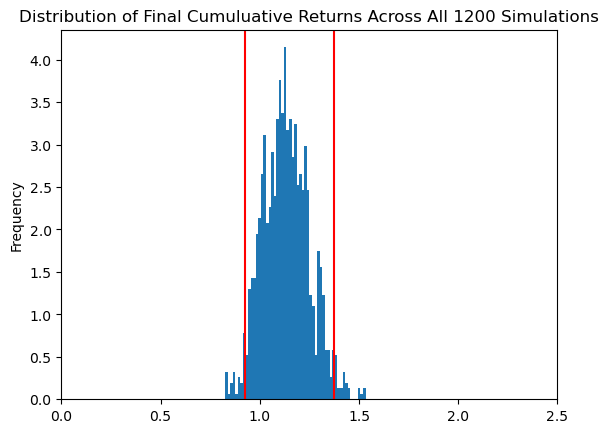

In [52]:
# Visualize the probability distribution of the 1 year Monte-Carlo simulation 
# by plotting a histogram
plt.xlim([0, 2.5])
distribution_plot_max_portfolio_plot = MC_max_portfolio.plot_distribution()

In [53]:
# Generate summary statistics from the 1 year Monte-Carlo simulation results
# Save the results as a variable
table_min_portfolio_weight = MC_min_portfolio.summarize_cumulative_return()

# Review the 1 year Monte Carlo summary statistics
print(table_min_portfolio_weight)

count           1200.000000
mean               0.947073
std                0.063462
min                0.740900
25%                0.903257
50%                0.943736
75%                0.988182
max                1.239407
95% CI Lower       0.836864
95% CI Upper       1.073478
Name: 63, dtype: float64


In [54]:
# Generate summary statistics from the 1 year Monte Carlo simulation results
# Save the results as a variable
table_opt_sharpe_ratio_portfolio_weight = MC_opt_sharpe_ratio_portfolio.summarize_cumulative_return()

# Review the 1 year Monte Carlo summary statistics
print(table_opt_sharpe_ratio_portfolio_weight)

count           1200.000000
mean               0.895519
std                0.099704
min                0.632300
25%                0.824643
50%                0.888715
75%                0.960323
max                1.207104
95% CI Lower       0.714576
95% CI Upper       1.112366
Name: 63, dtype: float64


In [55]:
# Generate summary statistics from the 1 year Monte-Carlo simulation results
# Save the results as a variable
table_max_portfolio_weight = MC_max_portfolio.summarize_cumulative_return()

# Review the 1 year Monte Carlo summary statistics
print(table_max_portfolio_weight)

count           1200.000000
mean               1.131830
std                0.116451
min                0.825407
25%                1.048521
50%                1.126566
75%                1.209766
max                1.533026
95% CI Lower       0.924500
95% CI Upper       1.373533
Name: 63, dtype: float64


In [56]:
# Print the initial investment in the portfolio
print(f"The initial investment of the portfolio is ${mpt.initial_test_investment:0.2f}")

The initial investment of the portfolio is $10000.00


In [57]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes for the MIN portfolio

# Get the lower and upper CI values
ci_lower_95per = table_min_portfolio_weight[8]
ci_upper_95per = table_min_portfolio_weight[9]

# Determine the lower and upper bounds of the expected cumaltiver returns
ci_lower_cumulative_return = round(ci_lower_95per * mpt.initial_test_investment, 2) 
ci_upper_cumulative_return = round(ci_upper_95per * mpt.initial_test_investment, 2)

# Print the result of your calculations
print()
print(f"There is a 95% chance that the current minimum portfolio value of ${mpt.initial_test_investment:0.2f}, will end within the range of"
      f" ${ci_lower_cumulative_return:0.2f} and ${ci_upper_cumulative_return:0.2f}.")
print(f"The actual realized value of the portfolio was ${investment_pnl_min:0.2f}")


There is a 95% chance that the current minimum portfolio value of $10000.00, will end within the range of $8368.64 and $10734.78.
The actual realized value of the portfolio was $9331.99


In [58]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes for the OPT SHARPE RATIO portfolio

# Get the lower and upper CI values
ci_lower_95per = table_opt_sharpe_ratio_portfolio_weight[8]
ci_upper_95per = table_opt_sharpe_ratio_portfolio_weight[9]

# Determine the lower and upper bounds of the expected cumaltive returns
ci_lower_cumulative_return = round(ci_lower_95per * mpt.initial_test_investment, 2) 
ci_upper_cumulative_return = round(ci_upper_95per * mpt.initial_test_investment, 2) 

# Print the result of your calculations
print()
print(f"There is a 95% chance that the current optimal Sharpe Ratio of a given portfolio value of ${mpt.initial_test_investment:0.2f}, will end within the range of"
      f" ${ci_lower_cumulative_return:0.2f} and ${ci_upper_cumulative_return:0.2f}.")
print(f"The actual realized value of the portfolio was ${investment_pnl_opt_sharpe_ratio:0.2f}")


There is a 95% chance that the current optimal Sharpe Ratio of a given portfolio value of $10000.00, will end within the range of $7145.76 and $11123.66.
The actual realized value of the portfolio was $9426.00


In [59]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes for the MAX portfolio

# Get the lower and upper CI values
ci_lower_95per = table_max_portfolio_weight[8]
ci_upper_95per = table_max_portfolio_weight[9]

# Determine the lower and upper bounds of the expected cumaltiver returns
ci_lower_cumulative_return = round(ci_lower_95per * mpt.initial_test_investment, 2)
ci_upper_cumulative_return = round(ci_upper_95per * mpt.initial_test_investment, 2) 

# Print the result of your calculations
print()
print(f"There is a 95% chance that the current maximum portfolio value of ${mpt.initial_test_investment:0.2f}, will end within the range of"
      f" ${ci_lower_cumulative_return:0.2f} and ${ci_upper_cumulative_return:0.2f}.")
print(f"The actual realized value of the portfolio was ${investment_pnl_max:0.2f}")


There is a 95% chance that the current maximum portfolio value of $10000.00, will end within the range of $9245.00 and $13735.33.
The actual realized value of the portfolio was $11682.48


In [60]:
# ending process
end_time = time.process_time()
print("Process time", end_time - start_time)

Process time 30.556816
